# Dog Breed Identification
This is an end to end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

### 1. Problem
Identifying the breed of a dog given an image of a dog.
### 2. Data
The data is from Kaggle's Dog Breed Identification Competition.

[kaggle.com/c/dog-breed-identification/data](https://)

### 3. Evaluation
Multi-class log loss function between predicted probability and observed target.

### 4. Features
* We're dealing with images(unstructured data)
* There are 120 dog breeds (which means we have 120 classes)
* 10000+ images which are labelled
* 10000+ images which are unlabelled

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
from matplotlib.pyplot import imread

In [ ]:
from keras import Sequential
from keras.layers import Dense

In [ ]:
from keras.models import load_model

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub

In [ ]:
import os

In [ ]:
tf.__version__, hub.__version__

('2.14.0', '0.15.0')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# !unzip "/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/dog-breed-identification-dataset.zip" -d "/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/"

## Turning images to tensors(numerical format)

In [ ]:
labels_csv = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/labels.csv")
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
len(labels_csv)

10222

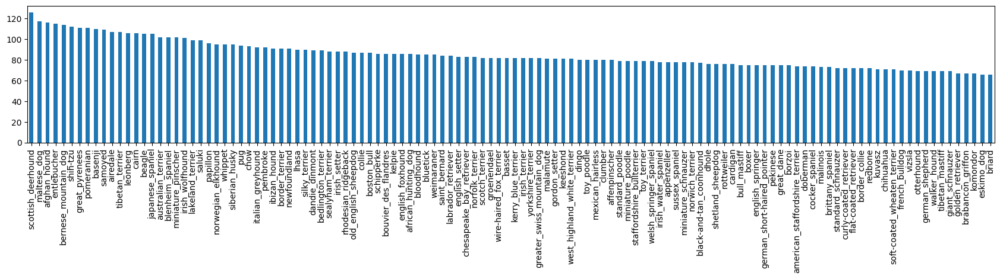

In [ ]:
labels_csv.breed.value_counts().plot(kind = "bar", figsize = (21, 3));

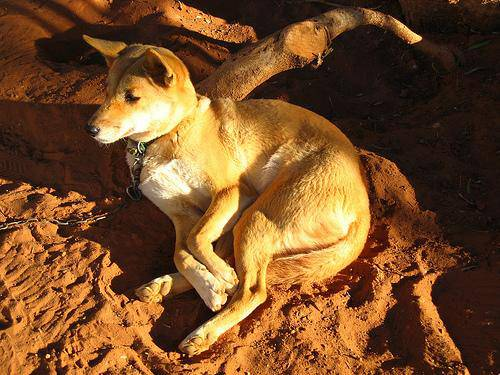

In [ ]:
from IPython.display import Image
Image("/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

## Getting images and labels

In [ ]:
filenames = ["/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/" + fname + ".jpg" for fname in labels_csv.id]
filenames[:10]

['/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/0042188c895a2f14ef6

In [ ]:
import os
if len(os.listdir("/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train")) == len(filenames):
  print("Proceed")
else:
  print("Mismatch")

Proceed


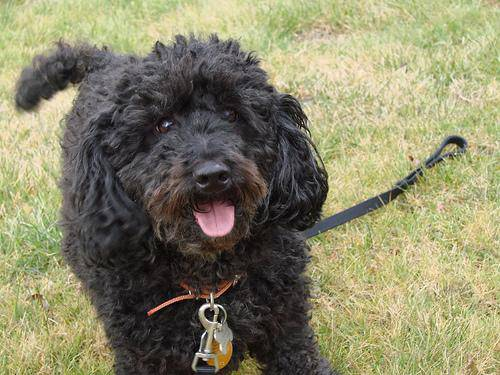

In [ ]:
Image(filenames[2300])

In [ ]:
labels = labels_csv["breed"]
labels

0                     boston_bull
1                           dingo
2                        pekinese
3                        bluetick
4                golden_retriever
                   ...           
10217                      borzoi
10218              dandie_dinmont
10219                    airedale
10220          miniature_pinscher
10221    chesapeake_bay_retriever
Name: breed, Length: 10222, dtype: object

In [ ]:
unique_labels = np.unique(labels)

In [ ]:
len(unique_labels)

120

In [ ]:
unique_labels

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
labels[0]

'boston_bull'

In [ ]:
bool_labels = [label == np.array(unique_labels) for label in labels]
len(bool_labels)

10222

In [ ]:
unique_labels[:5]

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier'], dtype=object)

In [ ]:
labels[:5]

0         boston_bull
1               dingo
2            pekinese
3            bluetick
4    golden_retriever
Name: breed, dtype: object

In [ ]:
bool_labels[:5]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

## Splitting into training and validation data

In [ ]:
X = filenames
y = bool_labels

In [ ]:
len(X)

10222

We'll start experimenting with ~1000 images.

In [ ]:
NUM_IMG = 9000 # @param {type:"slider", min:0, max:10000, step:1000}

In [ ]:
NUM_IMG

9000

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMG], y[:NUM_IMG], test_size=0.2, random_state = 42)

In [ ]:
len(X_train), len(X_val), len(y_train), len(y_val)

(7200, 1800, 7200, 1800)

In [ ]:
X_train[:5]

['/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/9f70486e63ac01868d87763df94226ec.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/1242da788ce85d4311e1cc9922a0a809.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/5dc913ed57f4ddb46db2d5e579fca853.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/c4438c44317572f7a432469a63203819.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/4927ede09ce508a92f4e38f8360df14e.jpg']

In [ ]:
y_train[:5]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False,  True, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

## Preprocessing Images (Images to Tensors)

For preprocessing we write a function which does a few things:
1. Take an image filepath as input
2. Use Tensorflow to read the image and save it to a variable `image`
3. Turn our `image` into tensors
4. Normalise RGB Channel values
5. Resize the `image` to be the shape of (224, 224)
6. Return the modified `image`

In [ ]:
#image to np arrays
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
IMG_SIZE = 224

In [ ]:
def process_image(img_path):
  """
  Takes image filepath and converts it into a Tensor
  """
  image = tf.io.read_file(img_path)
  # converting to 3 channel tensor(RGB)
  image = tf.image.decode_jpeg(image, channels = 3)
  # normalise rgb values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # resize image
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image

## Converting data into batches
* not possible to fit large data on memory
* batch size set to 32 to make it possible
* batch size adjustable if needed

In order to use Tensorflow, our data needs to be like `(image, label)`

In [ ]:
def get_image_label(img_path, label):
  """
  Processes the image and returns the image and associated label
  """
  image = process_image(img_path)
  return image, label

In [ ]:
get_image_label(X[0], tf.constant(y[0]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.5705322 , 0.33588538, 0.15008473],
         [0.66901225, 0.4601166 , 0.26022965],
         [0.61062384, 0.43763596, 0.21601713],
         ...,
         [0.8182312 , 0.7297958 , 0.26963907],
         [0.72454786, 0.6059109 , 0.2653059 ],
         [0.7494603 , 0.6252918 , 0.32456532]],
 
        [[0.6761415 , 0.4733761 , 0.30642927],
         [0.5672121 , 0.38192675, 0.20349538],
         [0.5883547 , 0.4322571 , 0.2403155 ],
         ...,
         [0.9326942 , 0.8260503 , 0.41093278],
         [0.86072475, 0.74250627, 0.3694122 ],
         [0.76781666, 0.6461604 , 0.29291284]],
 
        [[0.46350825, 0.29595745, 0.1536156 ],
         [0.42554107, 0.27039403, 0.12009468],
         [0.7887875 , 0.6547362 , 0.49015   ],
         ...,
         [0.89372385, 0.7696401 , 0.41811958],
         [0.88609535, 0.7585918 , 0.36495727],
         [0.8243601 , 0.69494826, 0.2930575 ]],
 
        ...,
 
        [[0.7344025 , 0.4716574 

In [ ]:
BATCH_SIZE = 32

In [ ]:
def create_batches(X, y = None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates batches of data from image(X) and label(Y) pairs.
  Shuffles the data if it is training data.
  Also accepts input with no labels
  """
  if test_data:
    print("Creating test batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
  elif valid_data:
    print("Creating validation batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
  else:
    print("Creating training batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    data = data.shuffle(buffer_size = len(X))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
  return data_batch

In [ ]:
train_data = create_batches(X_train, y_train)
val_data = create_batches(X_val, y_val, valid_data = True)

Creating training batches...
Creating validation batches...


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualising Data Batches

In [ ]:
import matplotlib.pyplot as plt

# create a function for visualising images in a batch
def show_25_images(images, labels):
  plt.figure(figsize = (20, 20))
  for i in range(25):
    ax = plt.subplot(5, 5, i + 1)
    plt.imshow(images[i])
    plt.title(unique_labels[labels[i].argmax()])
    # plt.axis("off")

In [ ]:
unique_labels[y[0].argmax()]

'boston_bull'

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[9.10714343e-02, 1.57738104e-01, 1.34208694e-01],
          [4.67086807e-02, 9.55532193e-02, 7.92717114e-02],
          [1.26051065e-03, 1.69467852e-02, 5.81233483e-03],
          ...,
          [1.06606856e-01, 9.09205750e-02, 5.49962446e-02],
          [6.02415651e-02, 5.75105399e-02, 3.73074226e-02],
          [5.69152683e-02, 6.08368367e-02, 3.73074226e-02]],
 
         [[9.28348750e-02, 1.59501538e-01, 1.35972127e-01],
          [4.95710820e-02, 9.84156206e-02, 8.21341053e-02],
          [1.26051065e-03, 1.95791665e-02, 8.44471529e-03],
          ...,
          [1.16332568e-01, 1.00646295e-01, 6.47219568e-02],
          [5.14442995e-02, 4.87132743e-02, 2.85101552e-02],
          [4.81180027e-02, 5.20395711e-02, 2.85101552e-02]],
 
         [[9.31614041e-02, 1.59828067e-01, 1.36298656e-01],
          [5.48056737e-02, 1.03650220e-01, 8.73686969e-02],
          [1.32874143e-03, 2.42279004e-02, 1.30934482e-02],
          ...,
          [1.07557580e-01, 9.18713063e-02, 5.5946

In [ ]:
len(train_images), len(train_labels)

(32, 32)

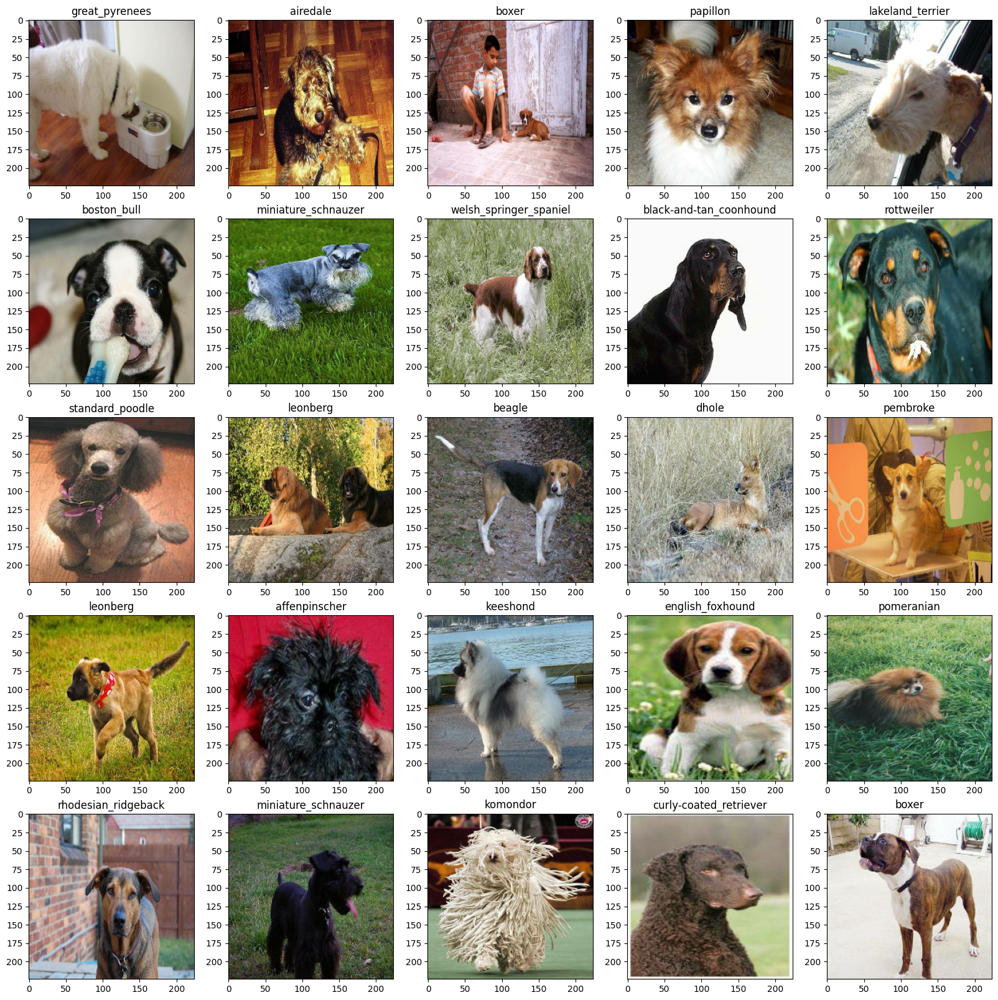

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

## Building a model
Few things to define before diving in:
* input shape
* output shape
* Model URL

In [ ]:
INPUT_SHAPE = [None, 224, 224, 3] # [batch, height, width, color_channels]
OUTPUT_SHAPE = len(unique_labels)
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"
# MODEL_URL = "https://www.kaggle.com/models/tensorflow/efficientnet/frameworks/TensorFlow2/variations/b0-classification/versions/1"

In [ ]:
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model = MODEL_URL):
  print("Building model with: ", MODEL_URL)

  model = Sequential(layers = [
      hub.KerasLayer(MODEL_URL),
      Dense(units = OUTPUT_SHAPE,
            activation = "softmax")
  ])
  model.compile(optimizer = tf.keras.optimizers.Adam(),
                loss = tf.keras.losses.CategoricalCrossentropy(),
                metrics = ["accuracy"])
  model.build(INPUT_SHAPE)
  return model

In [ ]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_5 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_5 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

In [ ]:
# load TensorBoard extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import datetime

# create a function to create callback function

def create_tensorboard_callback():
  logdir = os.path.join("/content/drive/MyDrive/Colab Notebooks/Dog Vision/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy",
                                                  patience = 3)

In [ ]:
EPOCHS = 100

In [ ]:
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  model = create_model()
  tensorboard = create_tensorboard_callback()
  model.fit(x = train_data,
            epochs = EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  return model

In [ ]:
model = train_model()
# model = load_model("/content/drive/MyDrive/Colab Notebooks/Dog Vision/first_model.h5")

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
225/225 [==============================] - 36s 140ms/step - loss: 1.6237 - accuracy: 0.6136 - val_loss: 0.7582 - val_accuracy: 0.7667
Epoch 2/100
225/225 [==============================] - 33s 147ms/step - loss: 0.4164 - accuracy: 0.8846 - val_loss: 0.7001 - val_accuracy: 0.7894
Epoch 3/100
225/225 [==============================] - 32s 144ms/step - loss: 0.2329 - accuracy: 0.9428 - val_loss: 0.6947 - val_accuracy: 0.7872
Epoch 4/100
225/225 [==============================] - 28s 124ms/step - loss: 0.1438 - accuracy: 0.9710 - val_loss: 0.7054 - val_accuracy: 0.7889
Epoch 5/100
225/225 [==============================] - 27s 121ms/step - loss: 0.0957 - accuracy: 0.9860 - val_loss: 0.7148 - val_accuracy: 0.7822


In [ ]:
# model.save(filepath= "/content/drive/MyDrive/Colab Notebooks/Dog Vision/first_model.h5")

In [ ]:
# !lsof -i:6006

In [ ]:
# !kill 12459
%tensorboard --logdir="/content/drive/MyDrive/Colab Notebooks/Dog Vision/logs"

Reusing TensorBoard on port 6006 (pid 20877), started 0:04:16 ago. (Use '!kill 20877' to kill it.)

<IPython.core.display.Javascript object>

## Making and evaluating predictions

In [ ]:
# make predictions on validation data (not used in training)
predictions = model.predict(val_data, verbose = 1)
predictions

57/57 [==============================] - 21s 114ms/step


array([[5.7591276e-08, 2.7558329e-08, 3.9242041e-05, ..., 2.7139201e-08,
        3.8069123e-07, 5.8554690e-08],
       [1.7179123e-07, 7.6937603e-09, 5.0198694e-09, ..., 4.3418327e-09,
        6.6472062e-08, 1.0824925e-03],
       [6.5144043e-08, 2.7200363e-07, 5.4662808e-09, ..., 2.5770501e-07,
        2.0103265e-07, 1.5278182e-06],
       ...,
       [9.6993863e-06, 1.9335531e-04, 1.7293135e-07, ..., 6.0698826e-06,
        7.1827912e-05, 2.2759912e-06],
       [2.6043693e-07, 1.2441624e-06, 4.4131076e-07, ..., 4.5677385e-07,
        4.2643965e-08, 2.7320521e-08],
       [1.4724858e-05, 1.0274296e-05, 3.2694629e-06, ..., 6.3955194e-06,
        1.8296308e-03, 1.6978768e-07]], dtype=float32)

In [ ]:
(np.max(predictions[0]))

0.99813485

In [ ]:
np.argmax(predictions[0])

62

In [ ]:
unique_labels[33]

'collie'

In [ ]:
def predicted_label(predictions):
  return unique_labels[np.argmax(predictions)]

In [ ]:
predicted_label(predictions[0])

'keeshond'

In [ ]:
# unbatching a dataset
def unbatchify(batch_data):
  images_ = []
  labels_ = []
  for image, label in batch_data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_labels[(np.argmax(label))])
  return images_, labels_

In [ ]:
val_images, val_labels = unbatchify(val_data)

In [ ]:
val_labels[0]

'keeshond'

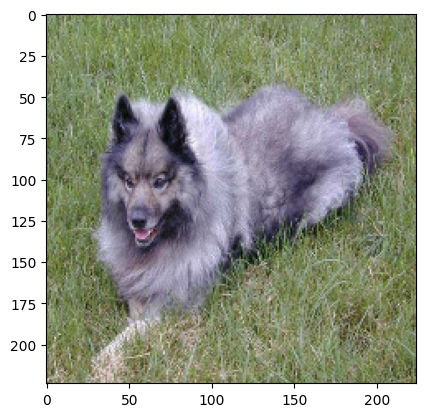

In [ ]:
plt.imshow(val_images[0])

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n = 1):
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  pred_label = predicted_label(pred_prob)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  plt.title(f"Predicted: {pred_label} \nProbability: {(np.max(pred_prob) * 100):2.0f}% \nTrue Label: {true_label}", color = color)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n = 1):
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  pred_label = predicted_label(pred_prob)
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  top_10_pred_labels = unique_labels[top_10_pred_indexes]
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = 'red')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")

  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")

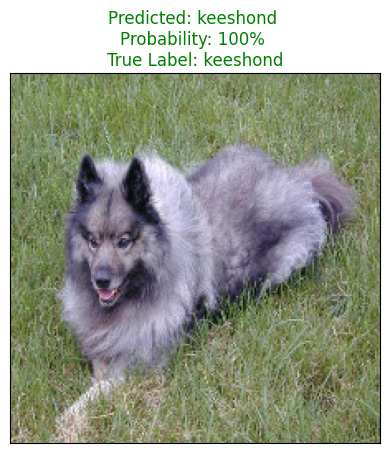

In [ ]:
plot_pred(predictions, val_labels, val_images, 0)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n = 1):
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  pred_label = predicted_label(pred_prob)
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  top_10_pred_labels = unique_labels[top_10_pred_indexes]
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = 'red')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")

  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")

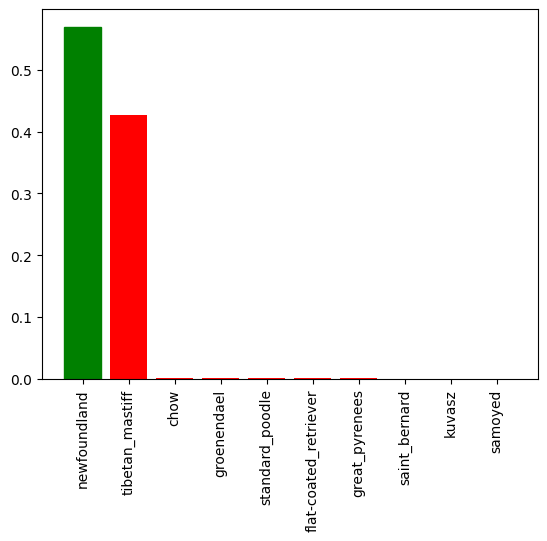

In [ ]:
plot_pred_conf(predictions, val_labels, 9)

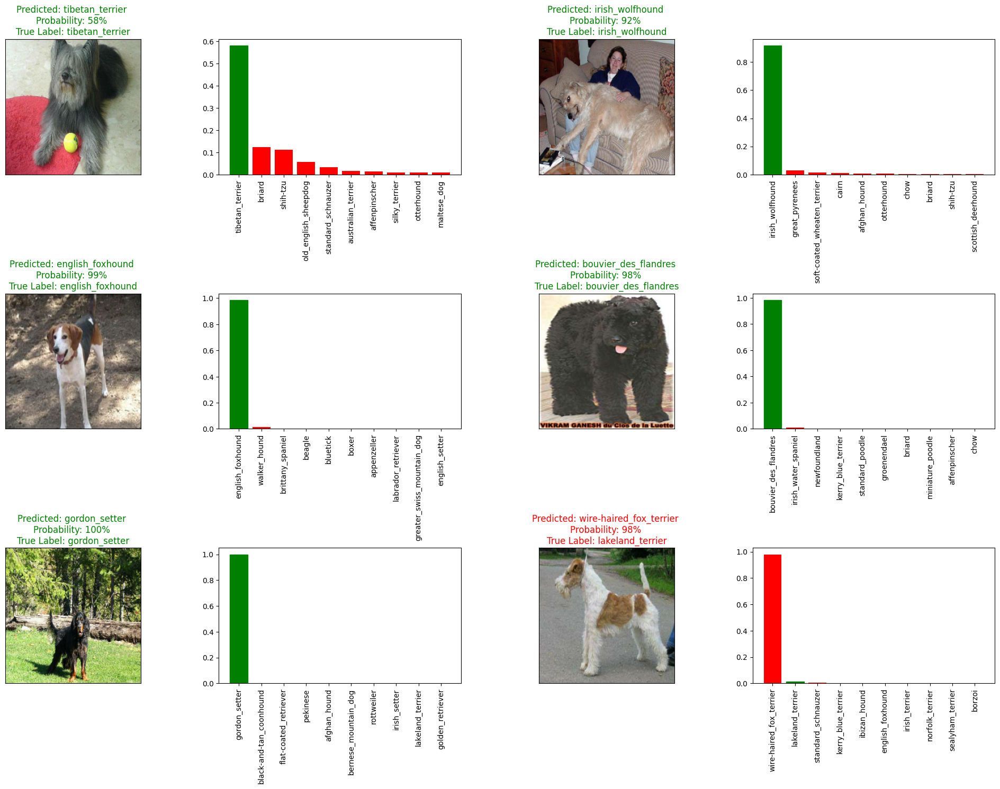

In [ ]:
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize = (10 * num_cols, 5* num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
  plot_pred(predictions,
            val_labels,
            val_images,
            i + i_multiplier)

  plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
  plot_pred_conf(predictions,
                 val_labels,
                 i + i_multiplier)
plt.tight_layout(h_pad = 1.0)
plt.show()

In [ ]:
def save_model(model, suffix = None):
  modeldir = os.path.join("/content/drive/MyDrive/Colab Notebooks/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  modelpath = modeldir + "_" + suffix + ".h5"
  print(f"Saving model to {modelpath} ...")
  model.save(modelpath)
  return modelpath

In [ ]:
def load_model(modelpath):
  print(f"Loading model from: {modelpath} ...")
  loaded_model = tf.keras.models.load_model(modelpath,
             custom_objects = {"KerasLayer" : hub.KerasLayer})
  return loaded_model

In [ ]:
save_model(model, suffix = "9000_images_mobilenetv2_Adam")

Saving model to /content/drive/MyDrive/Colab Notebooks/Dog Vision/models/20231129-16051701273921_9000_images_mobilenetv2_Adam.h5 ...


'/content/drive/MyDrive/Colab Notebooks/Dog Vision/models/20231129-16051701273921_9000_images_mobilenetv2_Adam.h5'

In [ ]:
loaded_1000_image_model = load_model("/content/drive/MyDrive/Colab Notebooks/Dog Vision/models/20230807-12461691412404_9000_images_effnetv2_Adam.h5")

Loading model from: /content/drive/MyDrive/Colab Notebooks/Dog Vision/models/20230807-12461691412404_9000_images_effnetv2_Adam.h5 ...


OSError: ignored

In [ ]:
model.evaluate(val_data)

In [ ]:
loaded_1000_image_model.evaluate(val_data)

## Training the model on the full dataset

In [ ]:
full_data = create_batches(X, y)

Creating training batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model = create_model()

Building model with:  https://www.kaggle.com/models/tensorflow/efficientnet/frameworks/TensorFlow2/variations/b0-classification/versions/1


In [ ]:
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                             patience = 3)
full_model.fit(x = full_data,
               epochs = EPOCHS,
               callbacks = [full_model_tensorboard,
                            full_model_early_stopping])

ValueError: ignored

In [ ]:
save_model(full_model, suffix = "full_imageset_effnetv2_Adam")

Saving model to /content/drive/MyDrive/Colab Notebooks/Dog Vision/models/20231129-15301701271835_full_imageset_effnetv2_Adam.h5 ...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Colab Notebooks/Dog Vision/models/20231129-15301701271835_full_imageset_effnetv2_Adam.h5'

In [ ]:
loaded_full_model = load_model("/content/drive/MyDrive/Colab Notebooks/Dog Vision/models/20230807-12591691413143_full_imageset_effnetv2_Adam.h5")

Loading model from: /content/drive/MyDrive/Colab Notebooks/Dog Vision/models/20230807-12591691413143_full_imageset_effnetv2_Adam.h5 ...


OSError: ignored

## Make predictions on test data
1. get test image filenames
2. create filenames and labels into batches
3. make predictions

In [ ]:
test_path = "/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

In [ ]:
len(test_filenames)

In [ ]:
test_data = create_batches(test_filenames, test_data = True)

In [ ]:
test_data

In [ ]:
test_predictions = loaded_full_model.predict(test_data, verbose = 1)

In [ ]:
np.savetxt("/content/drive/MyDrive/Colab Notebooks/Dog Vision/preds_array.csv", test_predictions, delimiter = ",")

In [ ]:
test_predictions = np.loadtxt("/content/drive/MyDrive/Colab Notebooks/Dog Vision/preds_array.csv", delimiter = ",")

In [ ]:
test_predictions.shape

In [ ]:
ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]

In [ ]:
preds_df = pd.DataFrame(columns = ["id"] + list(unique_labels))

In [ ]:
preds_df

In [ ]:
preds_df["id"] = ids

In [ ]:
preds_df

In [ ]:
preds_df[list(unique_labels)] = test_predictions
preds_df

In [ ]:
preds_df.to_csv("/content/drive/MyDrive/Colab Notebooks/Dog Vision/full_model_predictions2.csv",
                index = False)

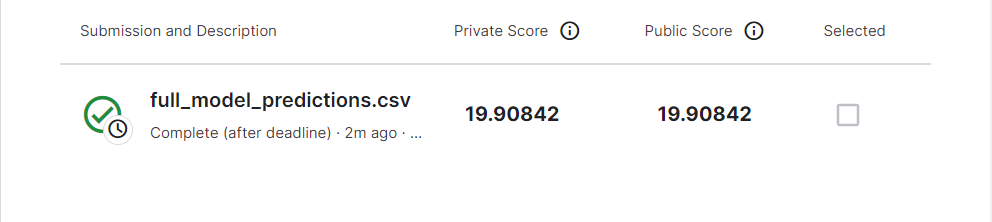

## Making predictions on custom images

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread
from keras import Sequential
from keras.layers import Dense
from keras.models import load_model
import tensorflow as tf
import tensorflow_hub as hub
import os
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
IMG_SIZE = 224

In [ ]:
BATCH_SIZE = 32

In [ ]:
def predicted_label(predictions):
  return unique_labels[np.argmax(predictions)]

In [ ]:
def process_image(img_path):
  """
  Takes image filepath and converts it into a Tensor
  """
  image = tf.io.read_file(img_path)
  # converting to 3 channel tensor(RGB)
  image = tf.image.decode_jpeg(image, channels = 3)
  # normalise rgb values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # resize image
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image

In [ ]:
def get_image_label(img_path, label):
  """
  Processes the image and returns the image and associated label
  """
  image = process_image(img_path)
  return image, label

In [ ]:
def create_batches(X, y = None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates batches of data from image(X) and label(Y) pairs.
  Shuffles the data if it is training data.
  Also accepts input with no labels
  """
  if test_data:
    print("Creating test batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
  elif valid_data:
    print("Creating validation batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
  else:
    print("Creating training batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    data = data.shuffle(buffer_size = len(X))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
  return data_batch

In [ ]:
def unbatchify(batch_data):
  images_ = []
  labels_ = []
  for image, label in batch_data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_labels[(np.argmax(label))])
  return images_, labels_

In [ ]:
def plot_custom_data(custom_data, custom_pred_labels):
  custom_images = []
  for image in custom_data.unbatch().as_numpy_iterator():
    custom_images.append(image)

  plt.figure(figsize = (10, 10))
  for i, image in enumerate(custom_images):
    plt.subplot(1, 3, i + 1)
    plt.xticks([])
    plt.yticks([])
    plt.title(custom_pred_labels[i])
    plt.imshow(image)

In [ ]:
labels = labels_csv["breed"]

In [ ]:
labels_csv = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/labels.csv")
unique_labels = np.unique(labels)

In [ ]:
loaded_full_model = load_model("/content/drive/MyDrive/Colab Notebooks/Dog Vision/models/20230807-12591691413143_full_imageset_effnetv2_Adam.h5",
                               custom_objects={'KerasLayer':hub.KerasLayer})

In [ ]:
custom_path = "/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/custom-data/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_data = create_batches(custom_image_paths, test_data = True)

In [ ]:
custom_data

In [ ]:
custom_preds = loaded_full_model.predict(custom_data)

In [ ]:
custom_pred_labels = [predicted_label(custom_preds[i]) for i in range(len(custom_preds))]

In [ ]:
custom_pred_labels

In [ ]:
plot_custom_data(custom_data, custom_pred_labels)

In [ ]:
%tensorboard --logdir="/content/drive/MyDrive/Colab Notebooks/Dog Vision/logs"